In [2]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import copy

# Image Rotation

In [26]:
def Rotation(image , angle , method):
    center = (image.shape[1] // 2, image.shape[0] // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, angle , 1)
    if method == 'Nearest' :
     rotated_image = cv.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]), flags=cv.INTER_NEAREST)
    if method == 'Bilinear' :
     rotated_image = cv.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]), flags=cv.INTER_LINEAR)
    return rotated_image

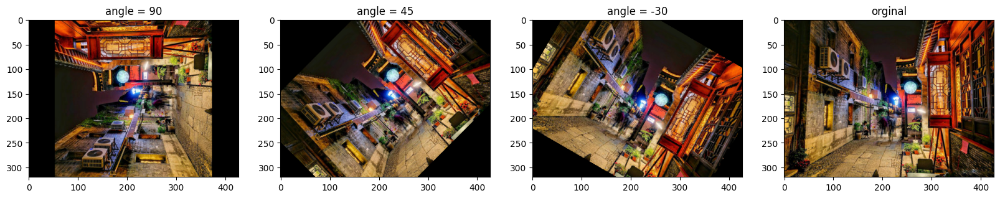

In [27]:
image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\lifeinchina.jpg')
fig, (ax1, ax2 , ax3 , ax4) = plt.subplots(1,4 , figsize=(20, 30))
rotated_image = Rotation(angle = 90 , image = image , method= 'Nearest')
rotated_image1 = Rotation(angle = 45 , image = image , method= 'Nearest')
rotated_image2 = Rotation(angle = -30 , image = image , method= 'Nearest')

ax1.imshow(cv.cvtColor(rotated_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(rotated_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(rotated_image2,cv.COLOR_BGR2RGB))
ax4.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax4.set_title('orginal', fontsize='large')
ax3.set_title('angle = -30', fontsize='large')
ax2.set_title('angle = 45', fontsize='large')
ax1.set_title('angle = 90', fontsize='large')
plt.show()

# Image Cropping

In [28]:
def crop(image ,x , y , h ,w):
    cropped_image = np.zeros((w, h, 3), np.uint8)
    for i in range(w ):
        for j in range(h ):
            cropped_image[i][j] = image[y+i][x+j]
    return cropped_image        

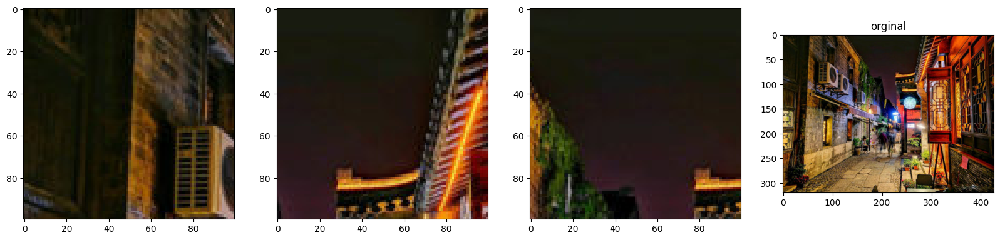

In [29]:

fig, (ax1, ax2 , ax3 , ax4) = plt.subplots(1,4 , figsize=(20, 30))
cropped_image = crop(image=image , x=1 , y=0 , w=100 , h=100)
cropped_image1 = crop(image=image , x=200 , y=0 , w=100 , h=100)
cropped_image2 = crop(image=image , x=150 , y=0 , w=100 , h=100)

ax1.imshow(cv.cvtColor(cropped_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(cropped_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(cropped_image2,cv.COLOR_BGR2RGB))
ax4.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax4.set_title('orginal', fontsize='large')
plt.show()

# Affine Transformation

## Translation

In [30]:
def Transformation(image,y,x):
    hight , width ,_ = image.shape
    transferred_image = cv.warpAffine(image , np.float32([[1, 0, x], [0, 1, y]]) ,(hight , width))
    return transferred_image

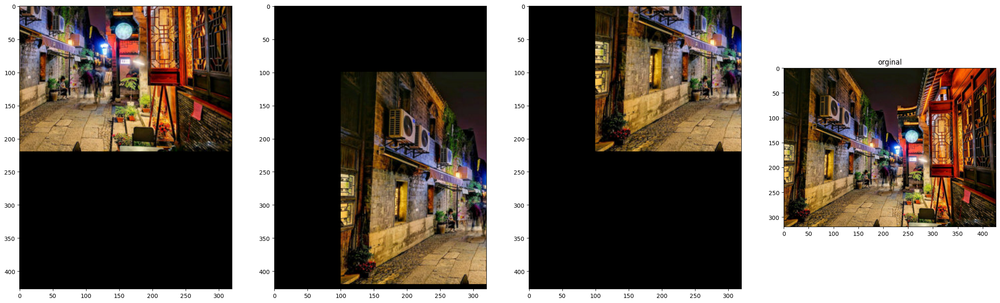

In [32]:
image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\lifeinchina.jpg')

fig, (ax1, ax2 , ax3 , ax4) = plt.subplots(1,4 , figsize=(30, 40))
transferred_image = Transformation(image,-100,-100)
transferred_image1 = Transformation(image,100,100)
transferred_image2 = Transformation(image,-100,100)

ax1.imshow(cv.cvtColor(transferred_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(transferred_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(transferred_image2,cv.COLOR_BGR2RGB))
ax4.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax4.set_title('orginal', fontsize='large')
plt.show()


## Scaling

In [33]:
def scale_up_down(image , center_x , center_y , scale):
    pts1 = np.float32([[center_x, center_y], [center_x+10, center_y], [center_x, center_y+10]])
    pts2 = np.float32([[center_x, center_y], [center_x+10*np.float32(scale), center_y], [center_x, center_y+10*np.float32(scale)]])
    matrix = cv.getAffineTransform(pts1, pts2)
    hight , width ,_ = image.shape
    scaled_image = cv.warpAffine(image, matrix, (width , hight ))
    return scaled_image

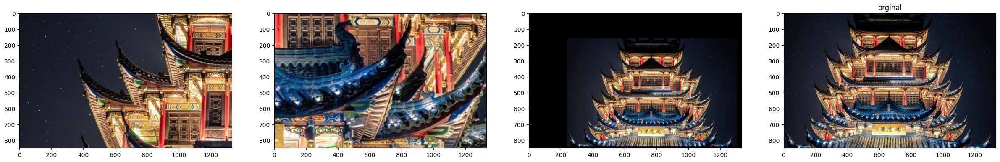

In [35]:

image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\palace.jpg')

fig, (ax1, ax2 , ax3 , ax4) = plt.subplots(1,4 , figsize=(30, 40))
scaled_image = scale_up_down(image , 200 , 200 , 3)
scaled_image1 = scale_up_down(image , 1000 , 700 , 4)
#number between 0 and 1 to scaledown
scaled_image2 = scale_up_down(image , 1200 , 800 , 0.8)

ax1.imshow(cv.cvtColor(scaled_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(scaled_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(scaled_image2,cv.COLOR_BGR2RGB))
ax4.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax4.set_title('orginal', fontsize='large')
plt.show()


## Shearing

In [37]:
def shear(image , factor , direction ):
    hight , width , _ = image.shape
    if direction == 'y': 
       sheara_matrix = np.float32([[1, 0, 0], [factor, 1, 0]])
    if direction == 'x': 
       sheara_matrix = np.float32([[1, factor, 0], [0, 1, 0]])   
    sheared_image = cv.warpAffine(image, sheara_matrix, (hight , width))
    return sheared_image

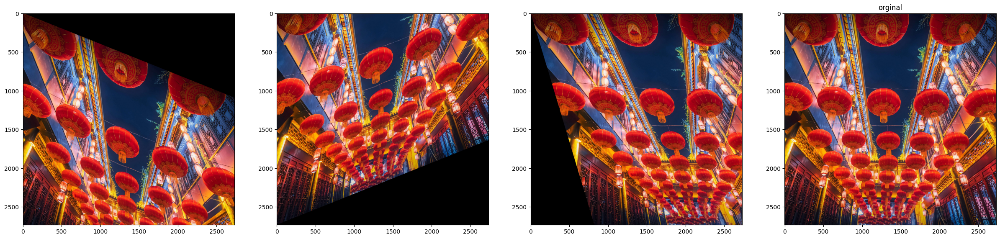

In [38]:

image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\chinanight.jpg')
rows, cols, _ = image.shape
fig, (ax1, ax2 , ax3 , ax4) = plt.subplots(1,4 , figsize=(30, 40))

sheared_image = shear(image , factor = 0.4 , direction = 'y')
sheared_image1 = shear(image , factor = -0.4 , direction = 'y')
sheared_image2 = shear(image , factor = 0.3 , direction = 'x')

ax1.imshow(cv.cvtColor(sheared_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(sheared_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(sheared_image2,cv.COLOR_BGR2RGB))
ax4.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax4.set_title('orginal', fontsize='large')
plt.show()

## Reflection

In [39]:
def Reflection(image , axis):
    rotated_image = cv.flip(image, axis)
    return rotated_image    

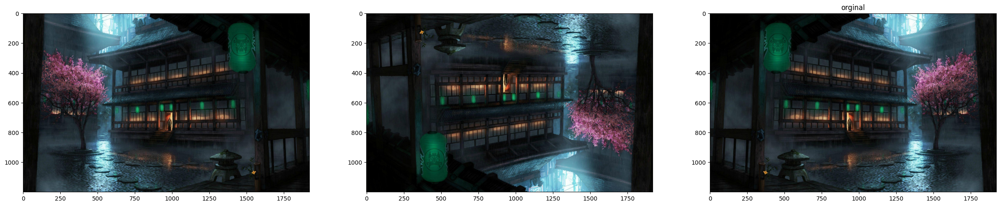

In [40]:


image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\oldhouse.jpg')
fig, (ax1, ax2 , ax3 ) = plt.subplots(1,3 , figsize=(30, 40))
rotated_image = Reflection(image , 1)
rotated_image1 = Reflection(image , 0)


ax1.imshow(cv.cvtColor(rotated_image,cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(rotated_image1,cv.COLOR_BGR2RGB))
ax3.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
ax3.set_title('orginal', fontsize='large')
plt.show()


# Perspective Transformation

In [41]:
def perspective(image , x ,y):
    pts1 = np.float32([[0, 0], [image.shape[1], 0], [0, image.shape[0]], [image.shape[1], image.shape[0]]])
    pts2 = np.float32([[0-np.float32(x), 0-np.float32(y)],              [image.shape[1]+np.float32(x), 0-np.float32(y)],
                       [0-np.float32(x), image.shape[0]+np.float32(y)], [image.shape[1]+np.float32(x), image.shape[0]+np.float32(y)]])

    matrix = cv.getPerspectiveTransform(pts1, pts2)
    hight , width , _ = image.shape

    result = cv.warpPerspective(image, matrix, (width , hight ))
    return result


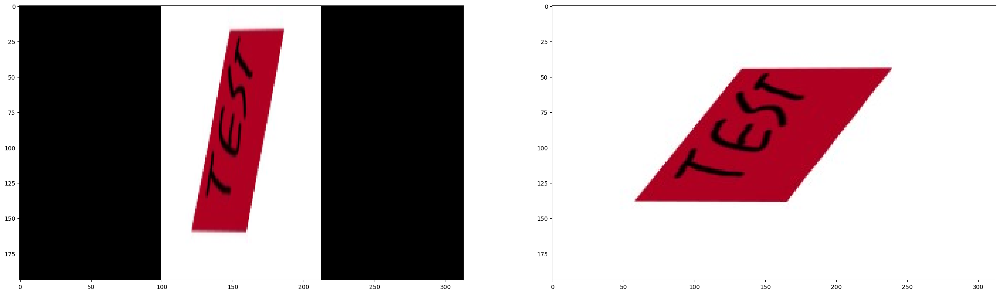

In [42]:
image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\Untitled.jpg')

fig, (ax1, ax2 , ) = plt.subplots(1,2 , figsize=(30, 40))

ax1.imshow(cv.cvtColor(perspective(image , -100 ,50),cv.COLOR_BGR2RGB))
ax2.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))

plt.show()


# Color Indexing

In [43]:
def Colorindexing(image , k ,max_interation, epsilon ):
    image_2d = np.float32(image.reshape(-1,3))
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, max_interation, epsilon)
    _, labels, centers = cv.kmeans(image_2d, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    return segmented_image


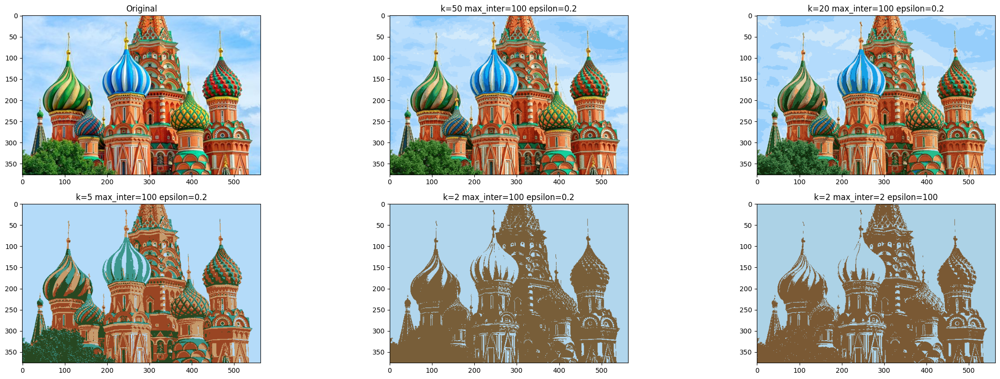

In [44]:

image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\indexing.jpg')


plt.figure(figsize= (24,8))
plt.subplot(231) , plt.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB)) , plt.title('Original')
plt.subplot(232) , plt.imshow(cv.cvtColor(Colorindexing(image , 50 ,100,0.2),cv.COLOR_BGR2RGB)) , plt.title('k=50 max_inter=100 epsilon=0.2')
plt.subplot(233) , plt.imshow(cv.cvtColor(Colorindexing(image , 20,100,0.2),cv.COLOR_BGR2RGB)) , plt.title('k=20 max_inter=100 epsilon=0.2')

plt.subplot(234) , plt.imshow(cv.cvtColor(Colorindexing(image, 5,100,0.2),cv.COLOR_BGR2RGB)) , plt.title('k=5 max_inter=100 epsilon=0.2')
plt.subplot(235) , plt.imshow(cv.cvtColor(Colorindexing(image, 2,100,0.2),cv.COLOR_BGR2RGB)) , plt.title('k=2 max_inter=100 epsilon=0.2')
plt.subplot(236) , plt.imshow(cv.cvtColor(Colorindexing(image, 2,2,100),cv.COLOR_BGR2RGB)) , plt.title('k=2 max_inter=2 epsilon=100')
plt.tight_layout()
plt.show()




reducing color indexes will cause data loss but it's worth it because it saves a lot of space and time for the model

# Color Space Conversion

In [3]:
def RGB_to_HSK(image):
    hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    return hsv_image

In [4]:
def RGB_to_LAB(image):
    lab_image = cv.cvtColor(image, cv.COLOR_BGR2LAB)
    return lab_image

In [5]:
def RGB_to_YCBCR(image):
    ycbcr_image = cv.cvtColor(image, cv.COLOR_BGR2YUV)
    return ycbcr_image

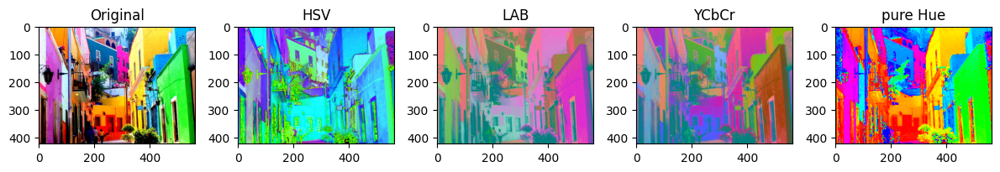

In [6]:
image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\color.jpg')
hue = RGB_to_HSK(image)
hue[:, :, 1] = 255 
hue[:, :, 2] = 255

plt.figure(figsize=(12, 6))
plt.subplot(151), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(152), plt.imshow(RGB_to_HSK(image)), plt.title('HSV')
plt.subplot(153), plt.imshow(RGB_to_LAB(image)), plt.title('LAB')
plt.subplot(154), plt.imshow(RGB_to_YCBCR(image)), plt.title('YCbCr')
plt.subplot(155), plt.imshow(cv.cvtColor(hue, cv.COLOR_HSV2RGB)), plt.title('pure Hue')
plt.tight_layout()
plt.show()



HSV (Hue, Saturation, Value): it separates color into three components hue, saturation, and value , its useful for color-based object detection and better human perception of colors  ,pure Hue image is able to clearly stress the boundaries and remove the lighting effects.

RGB(Original) : its not ideal for image processing and Each pixel is defined by three values (R,G,B) , objects are not separatable

LAB : its suitable for color correction and measuring perceptual differences , Each pixel is defined by three values(L (lightness), a (red-green), b (blue-yellow))  

YCbCr : by this color scpace we can reduce the image's size by its color channels without changing the brightness which is much more important:

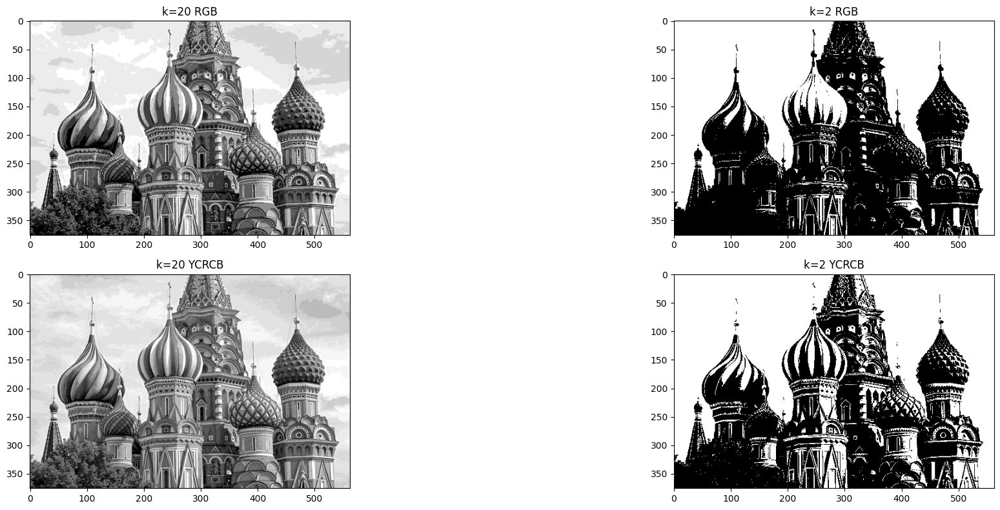

In [24]:

image = cv.imread('D:\\iaaa\\tamrina\\tamrin_4\\indexing.jpg')
image_ycrcb = cv.cvtColor(image , cv.COLOR_BGR2YCrCb)
image_ycrcb[:,:,1] = 255
image_ycrcb[:,:,2] = 255


plt.figure(figsize= (24,8))
plt.subplot(221) , plt.imshow(cv.cvtColor(Colorindexing(image , 20 ,100,0.2),cv.COLOR_BGR2GRAY), cmap='gray') , plt.title('k=20 RGB')
plt.subplot(223) , plt.imshow(cv.cvtColor(Colorindexing(image_ycrcb, 20,100,0.2),cv.COLOR_BGR2GRAY), cmap='gray') , plt.title('k=20 YCRCB')
plt.subplot(224) , plt.imshow(cv.cvtColor(Colorindexing(image_ycrcb, 2,100,0.2),cv.COLOR_BGR2GRAY), cmap='gray') , plt.title('k=2 YCRCB')
plt.subplot(222) , plt.imshow(cv.cvtColor(Colorindexing(image, 2,100,0.2),cv.COLOR_BGR2GRAY), cmap='gray') , plt.title('k=2 RGB')
plt.tight_layout()
plt.show()

as it can be seen by the graphs, RGB images that had three times more data, had more dataloss after color indexing than Ycrcb images.